# Module0-DSLR

## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math

pd.set_option('display.max_columns', None)

import joblib

%matplotlib inline

In [2]:
!pwd

/home/thrakoto/sgoinfre/4-Spe_DS-AI/module0-dslr


### Affichage partiel de la data

In [3]:
df_train = pd.read_csv('datasets/dataset_train.csv', sep = ',', header=0).drop(columns=['Index'])
df_train.head()

,Hogwarts House,First Name,Last Name,Birthday,Best Hand,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,Ravenclaw,Tamara,Hsu,2000-03-30,Left,58384.0,-487.886086,5.727180,4.878861,4.722,272.035831,532.484226,5.231058,1039.788281,3.790369,0.715939,-232.79405,-26.89
1,Slytherin,Erich,Paredes,1999-10-14,Right,67239.0,-552.060507,-5.987446,5.520605,-5.612,-487.340557,367.760303,4.107170,1058.944592,7.248742,0.091674,-252.18425,-113.45
2,Ravenclaw,Stephany,Braun,1999-11-03,Left,23702.0,-366.076117,7.725017,3.660761,6.140,664.893521,602.585284,3.555579,1088.088348,8.728531,-0.515327,-227.34265,30.42
3,Gryffindor,Vesta,Mcmichael,2000-08-19,Left,32667.0,697.742809,-6.497214,-6.977428,4.026,-537.001128,523.982133,-4.809637,920.391449,0.821911,-0.014040,-256.84675,200.64
4,Gryffindor,Gaston,Gibbs,1998-09-27,Left,60158.0,436.775204,-7.820623,NaN,2.236,-444.262537,599.324514,-3.444377,937.434724,4.311066,-0.264070,-256.38730,157.98


### Info

In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Hogwarts House                 1600 non-null   object 
 1   First Name                     1600 non-null   object 
 2   Last Name                      1600 non-null   object 
 3   Birthday                       1600 non-null   object 
 4   Best Hand                      1600 non-null   object 
 5   Arithmancy                     1566 non-null   float64
 6   Astronomy                      1568 non-null   float64
 7   Herbology                      1567 non-null   float64
 8   Defense Against the Dark Arts  1569 non-null   float64
 9   Divination                     1561 non-null   float64
 10  Muggle Studies                 1565 non-null   float64
 11  Ancient Runes                  1565 non-null   float64
 12  History of Magic               1557 non-null   f

## Data Analysis

### Describe

In [5]:
#!/usr/bin/env python3
import sys

def clean(list_nombre_temp):

    df_temp = pd.DataFrame(list_nombre_temp).dropna()
    # print(df_temp)
    return list(df_temp[0])


def tri_bulle(list_nombre):
    """sort"""

    list_nombre = clean(list_nombre)
    
    n = len(list_nombre)
    for i in range(n):
        for j in range(n - 1):
            if list_nombre[j] > list_nombre[j + 1]:
                temp = list_nombre[j]
                list_nombre[j] = list_nombre[j + 1]
                list_nombre[j + 1] = temp

    return list_nombre


def ft_count(list_nombre):
    """return mean"""

    list_nombre = clean(list_nombre)
    res = len(list_nombre)

    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")
    
    return res
    

def ft_min(list_nombre):
    """return mean"""

    list_nombre = clean(list_nombre)
    # res = min(list_nombre) Pas le droit a cette fonction

    res = 0
    for i, nb in enumerate(list_nombre):
        if i == 0:
            res = nb
        elif res > nb:
            res = nb
            
    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")
    
    return res


def ft_max(list_nombre):
    """return mean"""

    list_nombre = clean(list_nombre)
    # res = max(list_nombre)

    res = 0
    for i, nb in enumerate(list_nombre):
        if i == 0:
            res = nb
        elif res < nb:
            res = nb

    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")
    
    return res


def mean(list_nombre):
    """return mean"""

    list_nombre = clean(list_nombre)
    
    n = len(list_nombre)
    res = sum(x for x in list_nombre) / n
    
    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {res}")
    
    return res


def var(list_nombre, print_yn=1):
    """return var"""

    list_nombre = clean(list_nombre)
    
    n = len(list_nombre)
    moy = sum(x for x in list_nombre) / n
    res = sum((x - moy)**2 for x in list_nombre) / n

    # On met en sourdine
    # if (print_yn == 1):
    #     print(f"{sys._getframe(  ).f_code.co_name}: {res}")

    return res


def std(list_nombre):
    """return std"""

    list_nombre = clean(list_nombre)
    
    res = var(list_nombre, 0)
    res = res**0.5
    
    # On met en sourdine
    #print(f"{sys._getframe(  ).f_code.co_name}: {res}")

    return res


def median(list_nombre, print_yn=1):
    """return median"""

    list_nombre = clean(list_nombre)
    
    n = len(list_nombre)
    if n == 1:
        position = 0
        mediane = list_nombre[position]

    else:
        list_nombre = tri_bulle(list_nombre)
        # print(f"liste triee: {list_nombre}")

        if n % 2 == 0:
            position = int(n / 2) - 1
            mediane = (list_nombre[position] + list_nombre[position + 1]) / 2

        else:
            position = int(n // 2)
            mediane = list_nombre[position]

    # On met en sourdine
    # if (print_yn == 1):
    #     print(f"{sys._getframe(  ).f_code.co_name}: {mediane}")

    return (mediane, position)


def quartile(list_nombre):
    """return Quartile"""

    list_nombre = clean(list_nombre)
    
    n = len(list_nombre)
    if n <= 3:
        res = "not enough elements in list"

    else:
        list_nombre = tri_bulle(list_nombre)
        position = median(list_nombre, 0)[1]
        left = list_nombre[:position + 1]
        right = list_nombre[position:]
        position1 = median(left, 0)[1]
        position2 = median(right, 0)[1]
        res = []
        res.append(float(left[position1]))
        res.append(float(right[position2]))

    # On met en sourdine
    # print(f"{sys._getframe(  ).f_code.co_name}: {(res)}")

    return res



In [6]:
def ft_describe(df_temp):
    """Equivalent à df.describe() mais avec vos fonctions ft_"""
    
    df_temp = df_temp.select_dtypes(include=['int64', 'float'])
    # df_temp = df_temp.dropna()
    
    stats_names = ["count", "mean", "std", "min", "25%", "50%", "75%", "max"]
    result_dict = {stat: [] for stat in stats_names}
    
    for c in df_temp.columns:
        col = list(df_temp[c])
        
        # clean
        col_clean = clean(col)
        
        # Stats
        count_val = ft_count(col_clean)
        mean_val = mean(col_clean)
        std_val = std(col_clean)
        min_val = ft_min(col_clean)
        max_val = ft_max(col_clean)
        q25, q75 = quartile(col_clean)  # quartile renvoie [25%, 75%]
        median_val = median(col_clean)[0]
        
        # append
        result_dict["count"].append(count_val)
        result_dict["mean"].append(mean_val)
        result_dict["std"].append(std_val)
        result_dict["min"].append(min_val)
        result_dict["25%"].append(q25)
        result_dict["50%"].append(median_val)
        result_dict["75%"].append(q75)
        result_dict["max"].append(max_val)
    
    describe_df = pd.DataFrame(result_dict, index=df_temp.columns).T
    return describe_df




In [7]:
ft_describe(df_train)

,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
count,1566.000000,1568.000000,1567.000000,1569.000000,1561.00000,1565.000000,1565.000000,1557.000000,1566.000000,1570.000000,1560.000000,1600.000000,1600.000000
mean,49634.570243,39.797131,1.141020,-0.387863,3.15391,-224.589915,495.747970,2.963095,1030.096946,5.950373,-0.053427,-243.374409,21.958012
std,16674.479577,520.132330,5.218016,5.211132,4.15397,486.189433,106.251202,4.424353,44.111025,3.146852,0.971146,8.780895,97.601087
min,-24370.000000,-966.740546,-10.295663,-10.162119,-8.72700,-1086.496835,283.869609,-8.858993,906.627320,-4.697484,-3.313676,-261.048920,-181.470000
25%,38510.000000,-489.724217,-4.312118,-5.259095,3.09900,-577.580096,397.511047,2.218653,1026.171713,3.644900,-0.673439,-250.668590,-41.960000
50%,49013.500000,260.289446,3.469012,-2.589342,4.62400,-419.164294,463.918305,4.378176,1045.506996,5.874837,-0.044811,-244.867765,-2.515000
75%,60761.000000,524.392752,5.417321,4.904680,5.66700,254.994857,597.492230,5.825242,1058.409478,8.246324,0.588410,-232.557490,50.450000
max,104956.000000,1016.211940,11.612895,9.667405,10.03200,1092.388611,745.396220,11.889713,1098.958201,13.536762,3.056546,-225.428140,279.070000


## Data Visualization

### Histogram

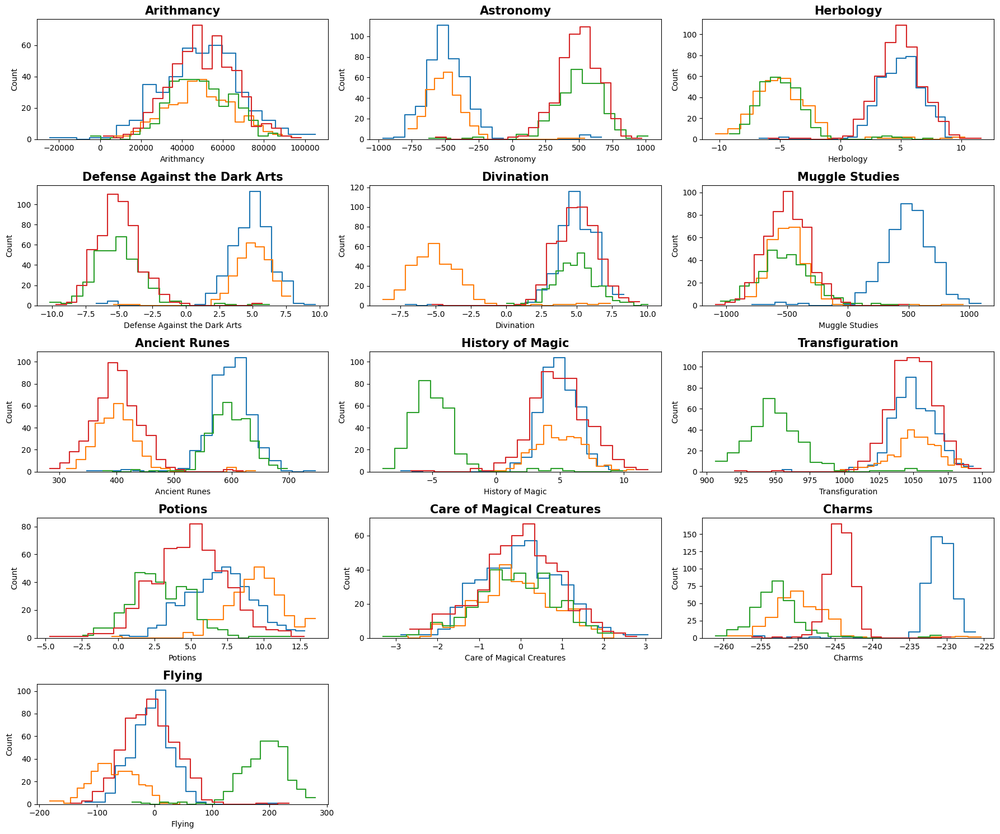

In [8]:
# Liste des colonnes numériques
col_shortl = [col for col in df_train.columns if df_train[col].dtype in ['float64', 'int64']]

# Paramètres
houses = list(df_train['Hogwarts House'].unique())
nb_col = 3
nb_lignes = math.ceil(len(col_shortl) / nb_col)

# Création de la figure globale
plt.figure(figsize=(6*nb_col, 3 * nb_lignes))

for i, col in enumerate(col_shortl):
    plt.subplot(nb_lignes, nb_col, i+1)
    for house in houses:
        sns.histplot(
        df_train[df_train['Hogwarts House'] == house][col],
        bins=20,
        element='step',
        fill=False,
        label=house
    )
    plt.title(col, fontdict={'fontsize': 15, 'fontweight': 'bold'})
plt.tight_layout()
plt.show()

#### Quel cours de Poudlard présente une répartition homogène des notes entre les quatre maisons ?

In [9]:
scores = {}

for col in col_shortl:

    # On enlève les notes manquantes
    data = df_train[[col, 'Hogwarts House']].dropna()

    # Même bins pour les 4 maisons
    bins = np.histogram_bin_edges(data[col], bins=20)

    distributions = []

    for house in houses:
        values = data[data['Hogwarts House'] == house][col]

        # Histogramme
        hist, _ = np.histogram(values, bins=bins)

        # Transformation en proportions
        hist = hist / hist.sum()

        distributions.append(hist)

    distributions = np.array(distributions)

    # On compare les 4 maisons dans chaque bin
    # Écart entre la maison la plus représentée et la moins représentée
    bin_difference = distributions.max(axis=0) - distributions.min(axis=0)

    # Score global
    score = bin_difference.mean()

    scores[col] = score

ranking = pd.Series(scores).sort_values()

print(ranking)


Care of Magical Creatures        0.020370
Arithmancy                       0.020585
Potions                          0.102213
Divination                       0.103530
Transfiguration                  0.104848
Herbology                        0.105056
Defense Against the Dark Arts    0.106684
Muggle Studies                   0.106727
Ancient Runes                    0.106812
Astronomy                        0.107462
History of Magic                 0.108948
Flying                           0.131291
Charms                           0.157647
dtype: float64


### Scatter Plot

In [10]:
def scatter_plot(my_df):

    cols = my_df.select_dtypes(include=["int64", "float64"]).columns
    
    corr_matrix = my_df[cols].corr()
    
    for i in range(len(cols)):
        for j in range(i+1, len(cols)):
            r = corr_matrix.iloc[i, j]
            if abs(r) > 0.999:
                print(f"{cols[i]} vs {cols[j]}, correl= {round(r, 3)})")
                print("-" * 50)
                plt.figure(figsize=(5, 7))
                sns.scatterplot(x=cols[i], y=cols[j], data=my_df, s=10, hue="Hogwarts House")
                plt.show();

    return
            

Astronomy vs Defense Against the Dark Arts, correl= -1.0)
--------------------------------------------------


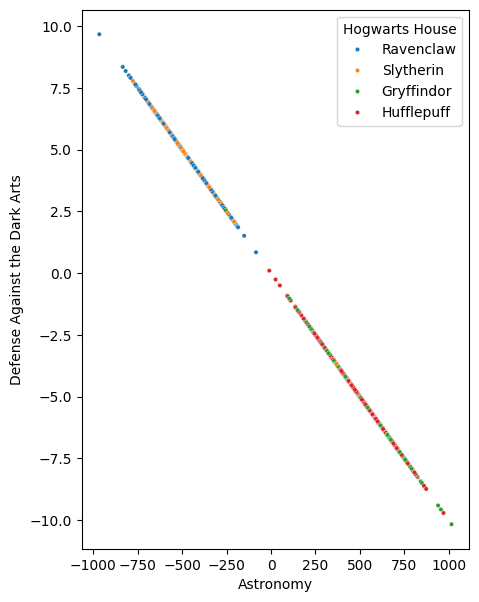

In [11]:
scatter_plot(df_train)

### Pairplot

In [12]:
def pair_plot(my_df):

    # Liste des colonnes numériques
    col_shortl = [col for col in my_df.columns if my_df[col].dtype in ['float64', 'int64']]
    houses = my_df['Hogwarts House'].unique()
    
    n = len(col_shortl)
    plt.figure(figsize=(3*n, 3*n))
    
    for i, col_x in enumerate(col_shortl):
        for j, col_y in enumerate(col_shortl):
            
            if col_x != col_y:
                plt.subplot(n, n, j*n + i + 1)
                sns.scatterplot(x=col_x, y=col_y, data=my_df, s=10, hue="Hogwarts House")
                plt.xticks([])
                plt.yticks([])
        
                sns.regplot(
                    x=col_x,
                    y=col_y,
                    data=my_df,
                    scatter=False,
                    color="black",
                    line_kws={"linewidth": 1})
        
                plt.xticks([])
                plt.yticks([])
    
            else:
                plt.subplot(n, n, j*n + i + 1)
                for house in houses:
                    sns.histplot(my_df[my_df['Hogwarts House'] == house][col_x], alpha = 0.2, label=house)
                plt.title(col_x, fontdict={'fontsize': 15, 'fontweight': 'bold'})
                
    
    plt.tight_layout()
    plt.show()

    return

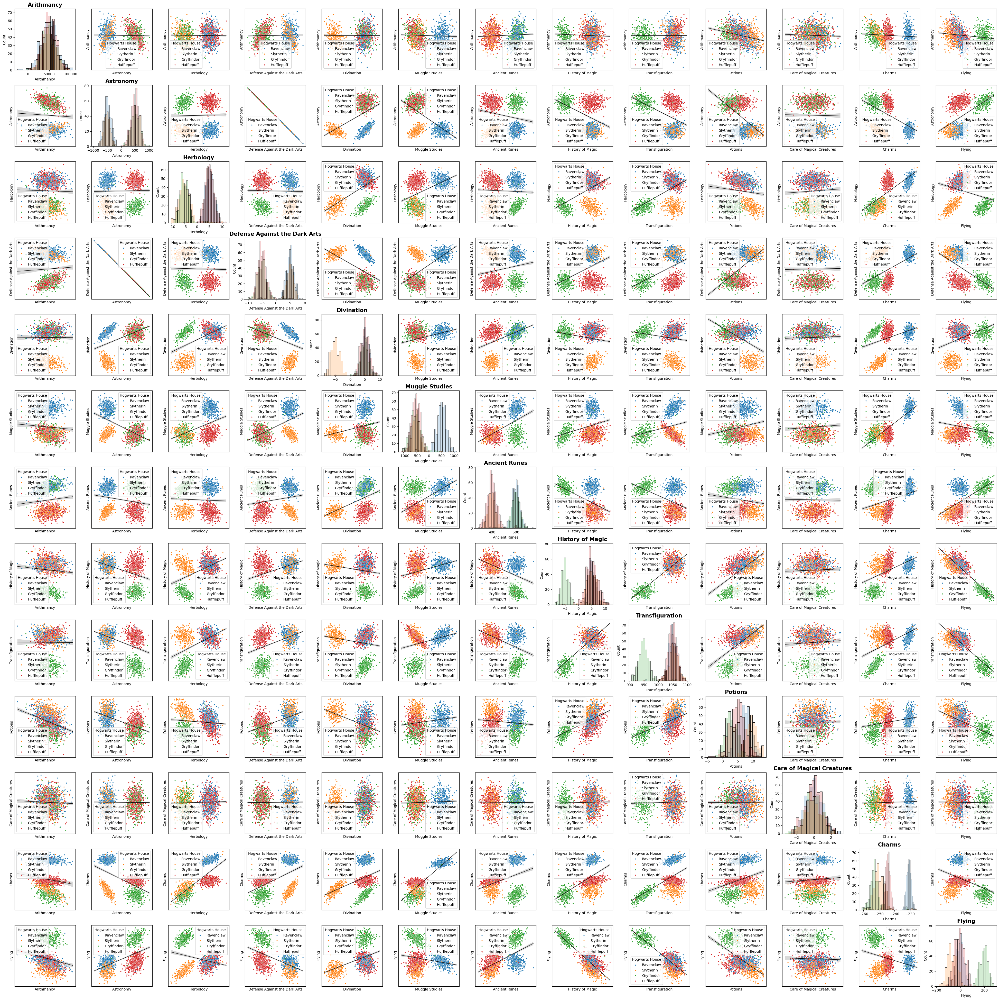

In [13]:
pair_plot(df_train)

### Option : Correlation

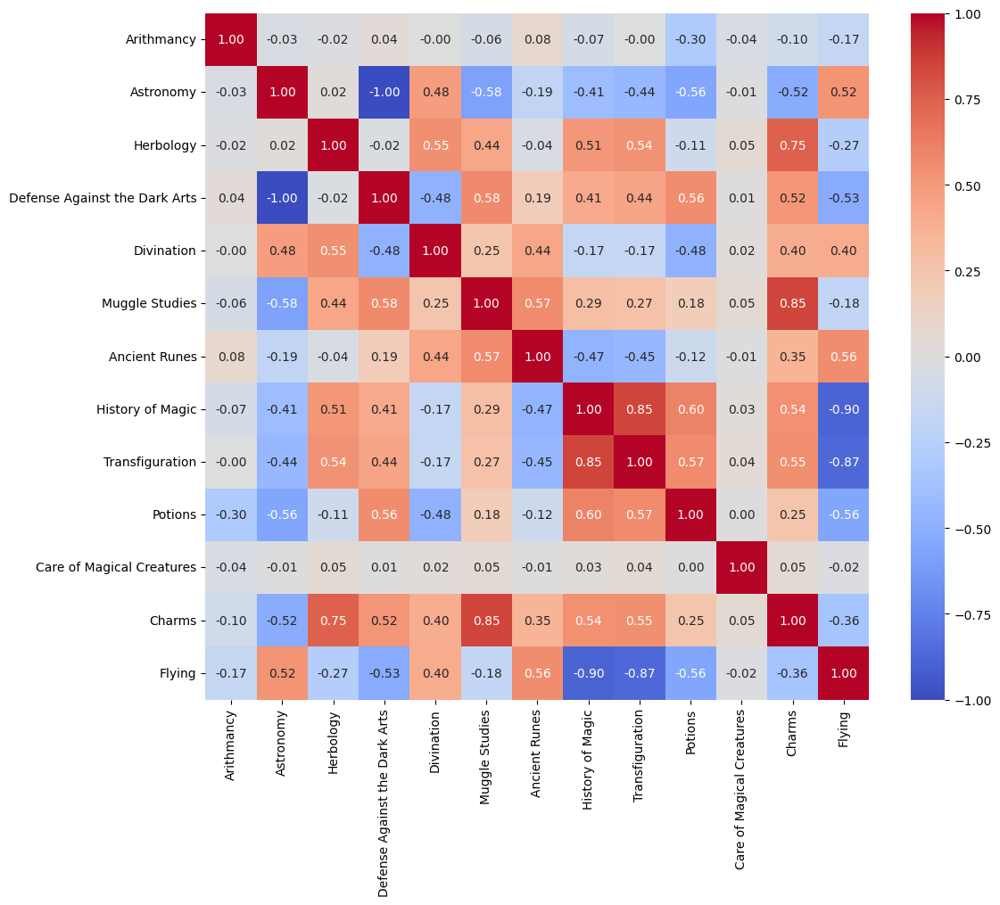

In [14]:
def ft_ecart_type(valeurs):
    n = len(valeurs)

    moyenne = sum(valeurs) / n

    somme = 0
    for valeur in valeurs:
        somme += (valeur - moyenne) ** 2

    variance = somme / n

    return math.sqrt(variance)


def ft_correlation(x, y):
    x = np.array(x)
    y = np.array(y)

    masque = ~np.isnan(x) & ~np.isnan(y)

    x = x[masque]
    y = y[masque]
    n = len(x)

    x_mean = mean(x)
    y_mean = mean(y)

    numerateur = np.sum((x - x_mean) * (y - y_mean))

    ecart_type_x = ft_ecart_type(x)
    ecart_type_y = ft_ecart_type(y)

    denominateur = n * ecart_type_x * ecart_type_y

    correlation = numerateur / denominateur

    return correlation


col_shortl = [
    col for col in df_train.columns
    if df_train[col].dtype in ['float64', 'int64']
]

tableau = pd.DataFrame(
    index=col_shortl,
    columns=col_shortl,
    dtype=float
)

for col1 in col_shortl:
    for col2 in col_shortl:
        x = df_train[col1].values
        y = df_train[col2].values

        tableau.loc[col1, col2] = ft_correlation(x, y)

plt.figure(figsize=(12, 10))

sns.heatmap(
    tableau,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f"
)

plt.show()


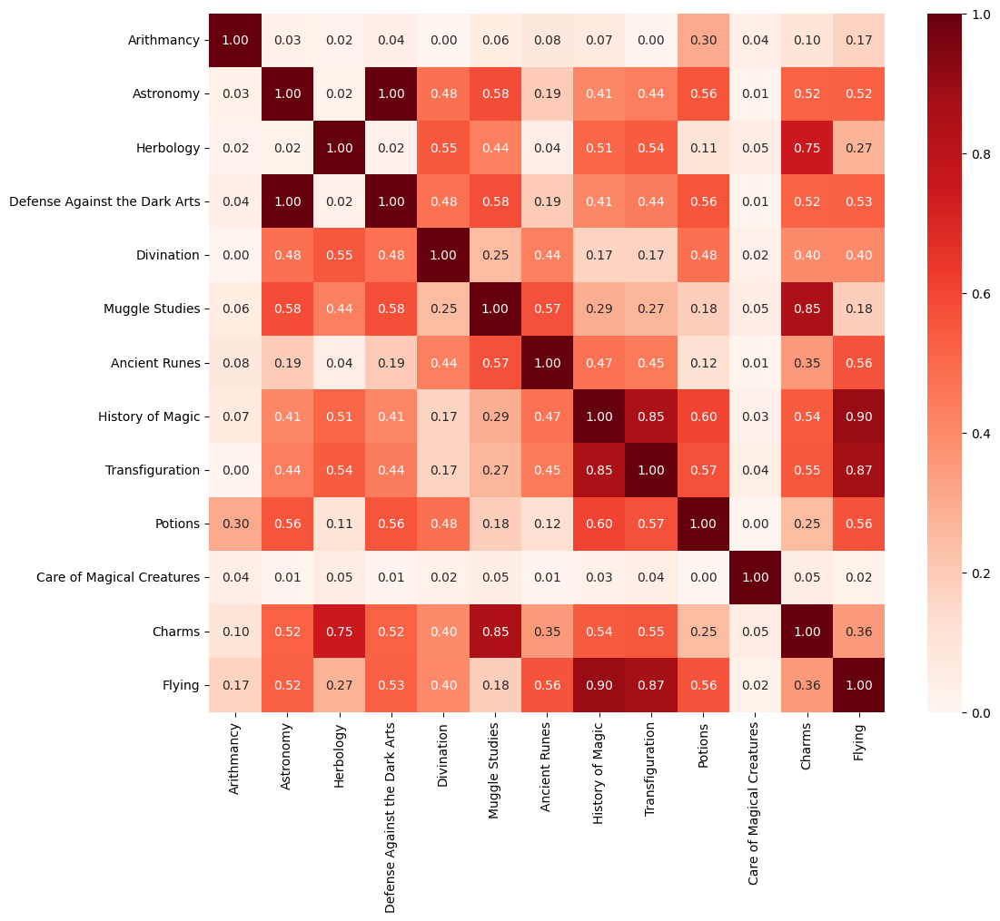

In [15]:
plt.figure(figsize=(12, 10))

sns.heatmap(
    tableau.abs(),
    cmap='Reds',
    vmin=0,
    vmax=1,
    annot=True,
    fmt=".2f"
)

plt.show()

### Train

In [16]:
import numpy as np
import matplotlib.pyplot as plt


class MyLogiR():
    """
    Description:
        Ma classe de regression logistique.
        Permet de faire une classification binaire avec une descente de gradient.
    """


    def __init__(self, thetas, alpha=0.001, max_iter=100000):

        self.alpha = alpha
        self.max_iter = max_iter
        self.thetas = thetas

        self.X_with_intercept = None
        self.predictions = None
        self.loss = None

        # Permet de garder l'historique de la loss et des thetas
        # surtout utile pour voir comment se comporte la descente de gradient
        self.histo_loss = []
        self.histo_thetas = []

        # On garde la moyenne et l'ecart type calcules sur le TRAIN
        # ATTENTION : il ne faudra surtout pas les recalculer sur le TEST
        # Le TEST devra etre standardise avec les valeurs apprises sur le TRAIN
        self.moy = None
        self.std = None

        self.imputer_mean = None


    def add_intercept(self, X):
        """
        Ajoute une colonne de 1 a X pour pouvoir prendre en compte l'intercept.
        """

        # Si X n'a qu'une seule feature, on transforme le vecteur en colonne
        # afin de pouvoir ensuite ajouter la colonne de 1
        if len(X.shape) == 1:
            X = X.reshape((-1, 1))

        # Creation d'une colonne de 1
        # Elle correspondra au theta_0, cad l'intercept
        cst = np.ones((X.shape[0], 1))

        # On ajoute la colonne de 1 au debut de X
        X = np.hstack((cst, X))

        # Je le garde aussi dans self car sigmoid_ l'utilise
        self.X_with_intercept = X

        return X


    def imputer_fit_(self, x):
        """
        Remplace les NaN par la moyenne de chaque feature.
    
        ATTENTION :
        cette fonction est utilisee pendant le FIT.
        Les moyennes sont donc calculees uniquement sur le TRAIN
        puis gardees dans self.imputer_mean.
        """
    
        # Calcul de la moyenne de chaque feature
        # np.nanmean permet d'ignorer les NaN pour calculer la moyenne
        self.imputer_mean = np.nanmean(x, axis=0)
    
        # On travaille sur une copie pour ne pas modifier X directement
        x_temp = x.copy()
    
        # On recupere la position de tous les NaN
        index_nan = np.where(np.isnan(x_temp))
    
        # Pour chaque NaN, on utilise la moyenne de la colonne correspondante
        x_temp[index_nan] = self.imputer_mean[index_nan[1]]
    
        return x_temp


    def imputer_transform_(self, x):
        """
        Remplace les NaN de nouvelles donnees avec les moyennes
        calculees sur le TRAIN pendant le fit.
        """
    
        # On travaille sur une copie pour ne pas modifier X directement
        x_temp = x.copy()
    
        # On recupere la position des NaN
        index_nan = np.where(np.isnan(x_temp))
    
        # ATTENTION :
        # on NE RECALCULE PAS les moyennes sur le TEST.
        #
        # On reutilise les moyennes apprises sur le TRAIN
        x_temp[index_nan] = self.imputer_mean[index_nan[1]]
    
        return x_temp
    
    
    def sigmoid_(self, x, thet=None):
        """
        Applique la fonction sigmoid.
        """

        # Si aucun theta n'est passe en argument,
        # on utilise les thetas actuels du modele
        if thet is None:
            thet = self.thetas.copy()

        # Calcul de z = X.theta
        y_hat = self.X_with_intercept @ thet

        # Application de la sigmoid
        # => transforme le resultat en une probabilite comprise entre 0 et 1
        y_hat = 1 / (1 + np.exp(-y_hat))

        return y_hat


    def logistic_predict_proba_(self, X, thet=None, transform=True):
        """
        Retourne une probabilite pour chaque ligne de X.
        """

        # Si aucun theta n'est passe,
        # on utilise les thetas appris par le modele
        if thet is None:
            thet = self.thetas.copy()

        # ATTENTION :
        # lorsque cette fonction est utilisee sur de nouvelles donnees,
        # par exemple X_test, il faut appliquer la MEME standardisation
        # que celle utilisee pendant le fit.
        #
        # On utilise donc self.moy et self.std calcules sur X_train.
        #
        # Pendant le fit, X est deja standardise.
        # Dans ce cas on appellera cette fonction avec transform=False
        # pour ne surtout pas standardiser une deuxieme fois.
        if transform:
            X = self.transform_(X)

        # Remarque : pour que la multiplication avec theta fonctionne,
        # il faut ajouter une colonne de 1 a X pour l'intercept
        x = self.add_intercept(X)

        # Calcul de la probabilite
        y_hat = self.sigmoid_(x, thet)

        self.predictions = y_hat.copy()

        return y_hat


    def logistic_predict_label(self, X, thet=None):
        """
        Transforme les probabilites en labels 0 ou 1.
        """

        # On commence par calculer les probabilites
        y_hat = self.logistic_predict_proba_(X, thet)

        # Si proba > 0.5 => classe 1
        # sinon => classe 0
        y_hat = (y_hat > 0.5).astype(int)

        return y_hat


    def log_loss_elem_(self, y, y_hat, eps=1e-15):
        """
        Calcule la log loss pour chaque ligne.
        """

        # Rappel :
        # log(0) n'existe pas et tend vers -inf
        #
        # np.clip permet donc de forcer les probabilites a rester
        # dans l'intervalle [eps, 1-eps]
        # => ca protege les np.log juste en dessous
        y_hat = np.clip(y_hat, eps, 1 - eps)

        # Formule de la Binary Cross Entropy
        res = -(y * np.log(y_hat)
                + (1 - y) * np.log(1 - y_hat))

        self.loss = res

        return res


    def log_loss_(self, y, y_hat, eps=1e-15):
        """
        Calcule la moyenne de la log loss sur toutes les observations.
        """

        # On calcule d'abord la loss pour chaque ligne
        ndarray_temp = self.log_loss_elem_(y, y_hat, eps)

        # Puis on fait la moyenne
        # => une seule valeur de loss pour tout le dataset
        res = np.sum(ndarray_temp) / ndarray_temp.shape[0]

        self.loss = res

        return res


    def vec_log_gradient(self, x, y):
        """
        Calcule le gradient de la log loss de maniere vectorisee,
        donc sans boucle sur les observations.
        """

        # Transforme les vecteurs en colonnes si necessaire
        if len(x.shape) == 1:
            x = x.reshape((-1, 1))

        if len(y.shape) == 1:
            y = y.reshape((-1, 1))

        # On travaille sur une copie des thetas actuels
        theta = self.thetas.copy()

        # Verif du nombre de lignes :
        # il faut autant de y que de lignes dans X
        if x.shape[0] != y.shape[0]:
            return None

        # On a :
        # nombre de theta = nombre de features + 1
        # car il faut egalement theta_0 pour l'intercept
        if theta.shape != (x.shape[1] + 1, 1):
            return None

        # Ajout de la colonne de 1 pour l'intercept
        x_with_ones = self.add_intercept(x)

        # Nombre d'observations
        m = x.shape[0]

        # Rappel :
        # gradient de la regression logistique :
        #
        # 1/m * X.T @ (y_hat - y)
        #
        # sigmoid_ retourne ici y_hat
        gradient = (
            x_with_ones.T
            @ (self.sigmoid_(x_with_ones, theta) - y)
        ) / m

        return gradient


    def zscore(self, x):
        """
        Standardise X avec un Z-score.

        ATTENTION :
        cette fonction est utilisee pendant le FIT.
        Elle calcule donc la moyenne et l'ecart type du TRAIN
        et les garde dans self.moy et self.std.
        """

        # Calcul de la moyenne de chaque feature sur le TRAIN
        moy = x.mean(axis=0)

        # Calcul de l'ecart type de chaque feature sur le TRAIN
        std = x.std(axis=0)

        # Attentio, risque si ecart type @ 0 (ie: toutes ses valeurs sont identiques.)
        # Rustine pour eviter une division par zero, on remplace son std par 1.
        # => Application : Dans ce cas la colonne standardisee vaudra simplement 0.
        std[std == 0] = 1

        # Z-score :
        # X_standardise = (X - moyenne) / ecart_type
        x_stand = x - moy
        x_stand = x_stand / std

        # TRES IMPORTANT :
        # on garde ces valeurs car il faudra utiliser EXACTEMENT
        # les memes pour standardiser X_test au moment du predict
        self.moy = moy
        self.std = std

        return x_stand


    def transform_(self, x):
        """
        Standardise de nouvelles donnees avec la moyenne et
        l'ecart type calcules pendant le fit.
        """

        # Si le modele n'a pas encore ete fit,
        # on ne possede pas encore moy et std
        if self.moy is None or self.std is None:
            return x

        x_temp = self.imputer_transform_(x)
        
        # ATTENTION :
        # ici on NE RECALCULE PAS moy et std
        # On reutilise ceux du TRAIN.
        x_temp = (x_temp - self.moy) / self.std

        return x_temp


    def fit_(self, x, y):
        """
        Entraine la regression logistique avec une descente de gradient.
        """

        # On s'assure que theta est bien un vecteur colonne
        self.thetas = self.thetas.reshape((-1, 1)).copy()

        # Meme chose pour y
        y = y.reshape((-1, 1))

        # 1 - On remplace les NaN avec les moyennes du TRAIN
        # Ces moyennes sont gardees dans self.imputer_mean
        x = self.imputer_fit_(x)
        
        # IMPORTANT :
        # on standardise X_train UNE SEULE FOIS avant la descente de gradient.
        # On va les reutiliser plus tard sur X_test.
        x = self.zscore(x)

        # Reset de l'historique si jamais fit_ est appele plusieurs fois
        self.histo_loss = []
        self.histo_thetas = []

        # Descente de gradient
        for i in range(self.max_iter):

            # Calcul du gradient avec les theta actuels
            linear_grad = self.vec_log_gradient(x, y)

            if linear_grad is None:
                return None

            # Pas de la descente de gradient
            increment = self.alpha * linear_grad

            # Mise a jour :
            # theta(n+1) = theta(n) - alpha * gradient
            self.thetas = self.thetas - increment

            # ATTENTION :
            # x a DEJA ete standardise au debut de fit_.
            #
            # On met donc transform=False sinon
            # logistic_predict_proba_ appliquerait une deuxieme fois
            # la standardisation.
            y_hat = self.logistic_predict_proba_(x, transform=False)

            # On garde l'historique de la loss
            # => utile pour verifier qu'elle diminue bien
            self.histo_loss.append(self.log_loss_(y, y_hat))

            # On garde egalement l'evolution des theta
            self.histo_thetas.append(self.thetas.copy())

        return self.thetas


    def plot_loss_throught_iter(self):
        """
        Permet de voir l'evolution de la loss pendant
        la descente de gradient.
        """

        plt.figure(figsize=(10, 5))

        plt.plot(
            range(len(self.histo_loss)),
            self.histo_loss
        )

        plt.title("Evolution de la loss pendant la descente de gradient")
        plt.xlabel("Iterations")
        plt.ylabel("Log loss")

        plt.show()


    def __str__(self):
        """
        Affiche toutes les methodes disponibles dans la classe.
        """

        methodes = [
            func for func in dir(self)
            if callable(getattr(self, func))
        ]

        return f"Fonctions disponibles : {', '.join(methodes)}"




In [24]:
class MyLogiR_1_vs_Rest:
    """
    Regression logistique multi-classes avec la methode One-vs-Rest.

    Le principe est d'entrainer un modele binaire MyLogiR
    pour chacune des classes.

    Exemple avec les maisons :

        Gryffindor  vs toutes les autres
        Hufflepuff vs toutes les autres
        Ravenclaw  vs toutes les autres
        Slytherin   vs toutes les autres
    """


    def __init__(self, alpha=0.001, max_iter=100000):

        self.alpha = alpha
        self.max_iter = max_iter

        # Contiendra la liste des classes
        # Exemple :
        # ['Gryffindor', 'Hufflepuff', 'Ravenclaw', 'Slytherin']
        self.classes = None

        # Dictionnaire qui permettra de garder un modele MyLogiR pour chacune des classes
        self.models = {}


    def fit_(self, X, y):
        """
        Entraine un modele de regression logistique pour chaque classe
        selon le principe One-vs-Rest.
        """

        # Les donnees peuvent arriver sous forme de DataFrame / Series pandas.
        # Comme les calculs de la classe sont faits avec numpy,
        # on les transforme une seule fois ici en ndarray.
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()
    
        if hasattr(y, "to_numpy"):
            y = y.to_numpy()
    
        # On recupere toutes les classes presentes dans y (ie: 4 maisons)
        self.classes = np.unique(y)
    
        # Reset au cas ou on appelle fit_ plusieurs fois
        self.models = {}
    
        # On va maintenant entrainer UN modele binaire
        # pour chacune des classes
        for classe in self.classes:
    
            print(f"Training : {classe} vs others")
    
            # Pour la classe que l'on est en train d'entrainer :
            #
            # classe actuelle => 1
            # toutes les autres => 0
            #
            # => Gryffindor : [Gryffindor == 1, Ravenclaw == 0, Hufflepuff == 0, Slytherin == 0]
            y_binary = (y == classe).astype(int)
    
            # On transforme y en vecteur colonne
            y_binary = y_binary.reshape((-1, 1))
    
            # Initialisation des theta a 0
            # Rappel: ne pas oublier l'intercept (=> n+1 tethas)
            thetas = np.zeros((X.shape[1] + 1, 1))
    
            # Creation d'une regression logistique binaire
            # pour la classe actuelle
            model = MyLogiR(
                thetas=thetas,
                alpha=self.alpha,
                max_iter=self.max_iter
            )
    
            # Entrainement du modele :
            # classe actuelle vs toutes les autres
            model.fit_(X, y_binary)

            # print("Nombre de prédictions différentes :")
            # print(np.sum(y_pred_val != y_val.to_numpy()))

            # print("Prédictions :")
            # print(np.unique(y_pred_val, return_counts=True))

            # print("Vraies classes :")
            # print(np.unique(y_val.to_numpy(), return_counts=True))

    
            # On garde le modele entraine dans le dictionnaire
            self.models[classe] = model
    
        return self


    def predict_proba_(self, X):
        """
        Calcule la probabilite obtenue pour chaque classe.

        Retour :
            une matrice de taille :
            nombre_observations x nombre_classes
        """

        # X peut arriver sous forme de DataFrame pandas.
        # Comme tous les calculs de MyLogiR sont faits avec numpy,
        # on le transforme en ndarray avant de faire les predictions.
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()
        
        probabilities = []

        # On passe X dans chacun des modeles binaires
        for classe in self.classes:

            # Recuperation du modele correspondant a la classe
            model = self.models[classe]

            # Calcul de :
            # P(classe | X)
            #
            # logistic_predict_proba_ va automatiquement
            # utiliser la moyenne et l'ecart type du TRAIN
            # qui ont ete sauvegardes pendant model.fit_()
            proba = model.logistic_predict_proba_(X)

            # proba est un vecteur colonne
            # => On le flatten pour pouvoir ensuite construire facilement la matrice de proba
            probabilities.append(proba.flatten())

        probabilities = np.column_stack(probabilities)

        return probabilities


    def predict_(self, X):
        """
        Retourne la classe predite pour chaque observation.
        """

        # On commence par calculer les probabilites
        # pour chacune des classes
        probabilities = self.predict_proba_(X)

        # Pour chaque ligne, on cherche la position de la probabilite max via np.argmax qui donne la position de la classe
        index_max = np.argmax(probabilities, axis=1)

        # self.classes contient les noms des maisons
        #
        # On transforme donc l'indice obtenu avec argmax en reverse encoding pour avoir les nom de classe en output.
        # Exemple : si index_max = 2 => self.classes[2] = "Ravenclaw"
        predictions = self.classes[index_max]

        return predictions

    def logreg_predict(self, X):
        predictions = self.predict_(X)
        result = pd.DataFrame({
            "Index": range(len(predictions)),
            "Hogwarts House": predictions
        })

        result.to_csv("houses.csv", index=False)

        return result



    def plot_loss_throught_iter(self):
        """
        Affiche l'evolution de la loss pour chacun
        des modeles binaires du One-vs-Rest.
        """

        # Comme on a un modele MyLogiR par maison,
        # => 4 descentes de gradient par Maison a afficher pour check la convergence
        for classe in self.classes:

            print(f"Loss : {classe} vs others")

            self.models[classe].plot_loss_throught_iter()


    def __str__(self):
        """
        Affiche toutes les methodes disponibles dans la classe.
        """

        methodes = [
            func for func in dir(self)
            if callable(getattr(self, func))
        ]

        return f"Fonctions disponibles : {', '.join(methodes)}"

### Accuracy

In [18]:
from sklearn.model_selection import train_test_split

# Dataset complet
X = df_train[col_shortl]
y = df_train["Hogwarts House"]

# On separe les donnees :
# 70% pour entrainer le modele
# 30% pour verifier ses performances sur des donnees qu'il n'a jamais vues
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.20,random_state=42,stratify=y)

print("X_train :", X_train.shape)
print("X_val   :", X_val.shape)
print("y_train :", y_train.shape)
print("y_val   :", y_val.shape)

for max_iter in [0, 50, 1000, 2000, 3000]:

    model = MyLogiR_1_vs_Rest(
        alpha=0.005,
        max_iter=max_iter
    )

    model.fit_(X_train, y_train)

    # Predictions sur les donnees utilisees pendant l'entrainement
    y_pred_train = model.predict_(X_train)

    # Predictions sur des donnees que le modele n'a jamais vues
    y_pred_val = model.predict_(X_val)

    acc_train = np.mean(
        y_pred_train == y_train.to_numpy()
    )

    acc_val = np.mean(
        y_pred_val == y_val.to_numpy()
    )

    print(
        f"{max_iter:5d} iterations : "
        f"train = {acc_train:.4f} | "
        f"val = {acc_val:.4f}"
    )






X_train : (1280, 13)
X_val   : (320, 13)
y_train : (1280,)
y_val   : (320,)
Training : Gryffindor vs others
Training : Hufflepuff vs others
Training : Ravenclaw vs others
Training : Slytherin vs others
    0 iterations : train = 0.2047 | val = 0.2031
Training : Gryffindor vs others
Training : Hufflepuff vs others
Training : Ravenclaw vs others
Training : Slytherin vs others
   50 iterations : train = 0.9820 | val = 0.9812
Training : Gryffindor vs others
Training : Hufflepuff vs others
Training : Ravenclaw vs others
Training : Slytherin vs others
 1000 iterations : train = 0.9820 | val = 0.9812
Training : Gryffindor vs others
Training : Hufflepuff vs others
Training : Ravenclaw vs others
Training : Slytherin vs others
 2000 iterations : train = 0.9820 | val = 0.9812
Training : Gryffindor vs others
Training : Hufflepuff vs others
Training : Ravenclaw vs others
Training : Slytherin vs others
 3000 iterations : train = 0.9820 | val = 0.9812


## Sauvegarde du modele

In [19]:
model_lr_manuel = MyLogiR_1_vs_Rest(alpha=0.005, max_iter=3000)
model_lr_manuel.fit_(X_train, y_train)

joblib.dump(model_lr_manuel, "model_logreg.pkl")

Training : Gryffindor vs others
Training : Hufflepuff vs others
Training : Ravenclaw vs others
Training : Slytherin vs others


['model_logreg.pkl']

## Load du modele

In [20]:
loaded_model_logreg = joblib.load("model_logreg.pkl")

## Prediction

In [21]:
df_test = pd.read_csv('datasets/dataset_test.csv', sep = ',', header=0).drop(columns=['Index'])

X_test = df_test[col_shortl]
# y_pred = loaded_model_logreg.predict_(X_test)
y_pred = loaded_model_logreg.logreg_predict(X_test)
y_pred

,Index,Hogwarts House
0,0,Hufflepuff
1,1,Ravenclaw
2,2,Gryffindor
3,3,Hufflepuff
4,4,Hufflepuff
...,...,...
395,395,Slytherin
396,396,Hufflepuff
397,397,Hufflepuff
398,398,Ravenclaw


# Bonus

## KNN

### La classe MyKNN_norm

In [22]:
import numpy as np


class MyKNN_norm:
    """
    Classification avec la methode des K plus proches voisins.

    Pour chaque nouvelle observation :
    - calcul de la distance avec tous les points du train
    - on garde les k points les plus proches
    - on regarde leurs classes
    - la classe majoritaire devient la prediction
    """

    def __init__(self, n_neighbors=5):

        # Nombre de voisins utilises pour la prediction
        self.n_neighbors = n_neighbors

        # On garde les data du train
        # => le KNN ne calcule pas de theta comme la regression logistique
        self.X_train = None
        self.y_train = None

        # Pour l'imputation des valeurs manquantes
        self.imputer_mean = None

        # Min et max calcules sur le TRAIN
        # => on les reutilisera pour le predict
        self.min = None
        self.max = None


    def distance_(self, point1, point2):
        """
        Calcule la distance euclidienne entre deux points.
        """

        distance = np.sqrt(np.sum((point1 - point2) ** 2))

        return distance


    def imputer_fit_(self, X):
        """
        Calcule les moyennes des colonnes du TRAIN.
        """

        # Moyenne de chaque feature sans tenir compte des NaN
        # => ces valeurs seront reutilisees pour le test
        self.imputer_mean = np.nanmean(X, axis=0)

        return self


    def imputer_transform_(self, X):
        """
        Remplace les NaN avec les moyennes calculees
        sur le TRAIN.
        """

        # Copie pour ne pas modifier les data originales
        X_temp = np.array(X, dtype=float, copy=True)

        # Position des NaN
        index_nan = np.where(np.isnan(X_temp))

        # On remplace chaque NaN par la moyenne de sa colonne
        # => moyenne calculee uniquement sur le train
        X_temp[index_nan] = self.imputer_mean[index_nan[1]]

        return X_temp


    def minmax_fit_(self, X):
        """
        Calcule le min et le max de chaque feature
        uniquement sur le TRAIN.
        """

        self.min = np.min(X, axis=0)
        self.max = np.max(X, axis=0)

        return self


    def minmax_transform_(self, X):
        """
        Normalise les data entre 0 et 1 avec le min et max
        calcules pendant le fit.
        """

        # Difference entre max et min
        range_ = self.max - self.min

        # Si max = min => feature constante
        # => on met 1 pour eviter une division par zero
        range_[range_ == 0] = 1

        X_temp = (X - self.min) / range_

        return X_temp


    def transform_(self, X):
        """
        Impute et normalise de nouvelles donnees.
        """

        # Si DataFrame => numpy
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()

        X = np.array(X, dtype=float, copy=True)

        # Meme transformation que pour le train
        # => imputation avec moyenne du train
        # => MinMax avec min/max du train
        X_temp = self.imputer_transform_(X)
        X_temp = self.minmax_transform_(X_temp)

        return X_temp


    def fit_(self, X, y):
        """
        Enregistre les donnees du TRAIN.

        Avec un KNN il n'y a pas vraiment d'entrainement
        comme avec notre regression logistique.
        """

        # Si DataFrame / Series => numpy
        if hasattr(X, "to_numpy"):
            X = X.to_numpy()

        if hasattr(y, "to_numpy"):
            y = y.to_numpy()

        X = np.array(X, dtype=float, copy=True)
        y = np.array(y)

        # Imputation
        # => calcul des moyennes uniquement sur le train
        self.imputer_fit_(X)
        X_temp = self.imputer_transform_(X)

        # MinMax
        # => calcul du min et max uniquement sur le train
        self.minmax_fit_(X_temp)
        X_temp = self.minmax_transform_(X_temp)

        # On garde toutes les observations du train en memoire
        # => elles serviront pour calculer les distances pendant predict
        self.X_train = X_temp
        self.y_train = y

        return self


    def predict_one_(self, point):
        """
        Prediction pour UNE seule observation.
        """

        distances = []

        # On calcule la distance avec tous les points du train
        for point_train in self.X_train:
            distance = self.distance_(point, point_train)
            distances.append(distance)

        distances = np.array(distances)

        # On trie les distances
        # => on garde les index des k voisins les plus proches
        index_nearest = np.argsort(distances)[:self.n_neighbors]

        # On recupere les classes des k voisins
        nearest_labels = self.y_train[index_nearest]

        # On compte combien de fois chaque classe apparait
        classes, counts = np.unique(nearest_labels, return_counts=True)

        # Classe qui apparait le plus souvent
        # => vote majoritaire
        index_max = np.argmax(counts)
        prediction = classes[index_max]

        return prediction


    def predict_(self, X):
        """
        Prediction pour toutes les observations de X.
        """

        # Transformation des nouvelles data
        # => imputation + MinMax avec les valeurs du train
        X_temp = self.transform_(X)

        predictions = []

        # Prediction ligne par ligne
        for point in X_temp:
            prediction = self.predict_one_(point)
            predictions.append(prediction)

        return np.array(predictions)


    def score_(self, X, y):
        """
        Calcule l'accuracy.
        """

        if hasattr(y, "to_numpy"):
            y = y.to_numpy()

        y_pred = self.predict_(X)

        # Nombre de bonnes predictions / nombre total
        accuracy = np.mean(y_pred == y)

        return accuracy


### Hyper-parametres

In [34]:
# df_train_temp = df_train[col_shortl].copy()
df_train_temp = df_train[col_shortl].copy()
df_train_temp["Hogwarts House"] = df_train['Hogwarts House']

def label_encode_manuel(x):
            
    if x == 'Ravenclaw':        
        return "0"    
    elif x == 'Slytherin':        
        return "1"
    elif x == 'Gryffindor':        
        return "2"
    elif x == 'Hufflepuff':        
        return "3"
		
df_train_temp["houses"] = ""
df_train_temp.loc[:,'houses'] = df_train_temp['Hogwarts House'].apply(label_encode_manuel)

# print(df_train_temp.head())

# Dataset complet
data = df_train_temp[col_shortl + ["houses"]].copy()

#print(data.head())

n_split = 5
len_split = int(data.shape[0] / n_split)

# On melange les lignes du dataset
# => random_state pour pouvoir retrouver exactement le meme resultat
data = data.sample(frac=1, random_state=42)

# Les valeurs de k que l'on veut tester
k_values = range(1, 16, 2)

scores_mean = []
scores_std = []

# On teste chaque valeur de k
for n_neighbors in k_values:

    scores = []

    # Initialisation du premier fold
    start = 0
    stop = len_split

    # Cross validation manuelle a 5 folds
    for fold in range(n_split):

        # Le fold courant sert de validation
        data_val = data.iloc[start:stop, :]

        # Toutes les autres lignes servent pour le train
        data_train = data.drop(index=data_val.index)

        # Separation X / y
        X_train = data_train[col_shortl]
        y_train = data_train["houses"]

        X_val = data_val[col_shortl]
        y_val = data_val["houses"]

        # Creation du KNN avec le k que l'on est en train de tester
        model_knn = MyKNN_norm(n_neighbors=n_neighbors)

        # Fit uniquement sur le train
        # => imputation et standardisation sont donc calculees sur le train
        model_knn.fit_(X_train, y_train)

        # Prediction sur le fold de validation
        y_pred = model_knn.predict_(X_val)

        # Accuracy du fold
        accuracy = np.mean(y_pred == y_val.to_numpy())

        scores.append(accuracy)

        # Setup du prochain fold
        start = stop
        stop += len_split

    # Moyenne et std des 5 folds pour ce k
    scores_mean.append(np.array(scores).mean())
    scores_std.append(np.array(scores).std())

    print(
        f"k = {n_neighbors:2d} | "
        f"scores = {[round(score, 4) for score in scores]} | "
        f"mean = {np.mean(scores):.4f} | "
        f"std = {np.std(scores):.4f}"
    )

k =  1 | scores = [0.9531, 0.9594, 0.9719, 0.9625, 0.9625] | mean = 0.9619 | std = 0.0061
k =  3 | scores = [0.9844, 0.9812, 0.9844, 0.9781, 0.9719] | mean = 0.9800 | std = 0.0047
k =  5 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9719] | mean = 0.9819 | std = 0.0061
k =  7 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9719] | mean = 0.9819 | std = 0.0061
k =  9 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9719] | mean = 0.9819 | std = 0.0061
k = 11 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9719] | mean = 0.9819 | std = 0.0061
k = 13 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9719] | mean = 0.9819 | std = 0.0061
k = 15 | scores = [0.9875, 0.9844, 0.9875, 0.9781, 0.9719] | mean = 0.9819 | std = 0.0061


In [35]:
best_score = max(scores_mean)

# On considere comme ex-aequo les scores identiques a 4 decimales
index_best = [i for i, score in enumerate(scores_mean) if round(score, 4) == round(best_score, 4)]

# Parmi les meilleurs => on prend celui avec la plus petite std
index_best = min(index_best, key=lambda i: scores_std[i])

best_k = list(k_values)[index_best]
best_score = scores_mean[index_best]
best_std = scores_std[index_best]

print(f"\nMeilleur k : {best_k}")
print(f"Accuracy moyenne : {best_score:.4f}")
print(f"Std : {best_std:.4f}")


Meilleur k : 5
Accuracy moyenne : 0.9819
Std : 0.0061


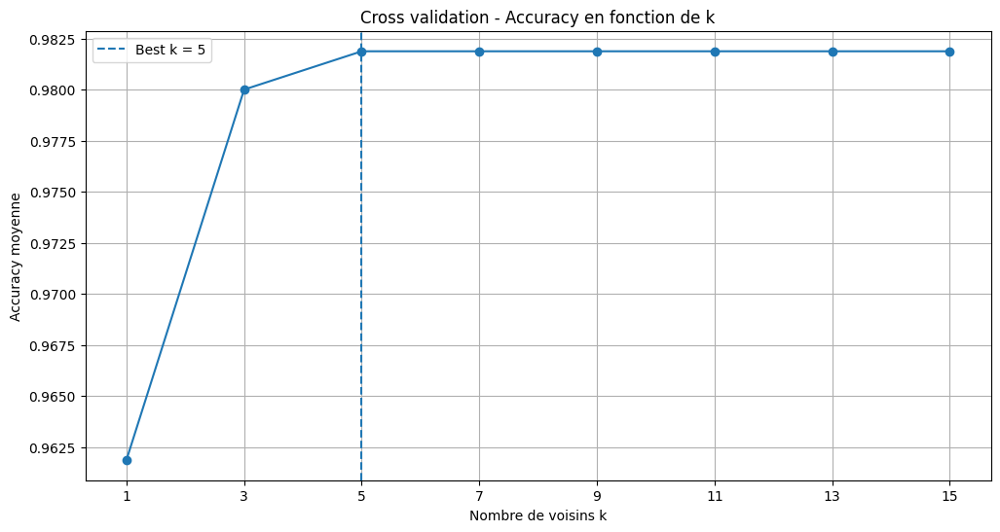

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

plt.plot(k_values, scores_mean, marker='o')

# On affiche le meilleur k
plt.axvline(best_k, linestyle='--', label=f'Best k = {best_k}')

plt.xticks(k_values)

plt.xlabel("Nombre de voisins k")
plt.ylabel("Accuracy moyenne")
plt.title("Cross validation - Accuracy en fonction de k")

plt.legend()
plt.grid()

plt.show()

### Entrainement sur toute la data

In [37]:
# Toute la data
X_train = df_train_temp[col_shortl]
y_train = df_train_temp["houses"]

# Les 3 modeles
model_knn = MyKNN_norm(n_neighbors=5)

# Entrainement sur toute la data
model_knn.fit_(X_train, y_train)

### Predictions

In [38]:
X_test = df_test[col_shortl]

y_pred = model_knn.predict_(X_test)

y_pred

array(['3', '0', '2', '3', '3', '1', '0', '3', '0', '3', '3', '1', '1',
       '1', '1', '3', '0', '1', '0', '3', '3', '1', '0', '0', '3', '3',
       '0', '1', '2', '0', '3', '3', '2', '3', '3', '0', '2', '0', '1',
       '0', '0', '1', '3', '1', '3', '0', '1', '2', '0', '1', '0', '3',
       '0', '0', '3', '1', '1', '0', '3', '2', '2', '2', '3', '3', '0',
       '3', '3', '0', '3', '0', '1', '1', '2', '0', '2', '3', '3', '2',
       '0', '2', '0', '3', '1', '2', '2', '3', '3', '3', '0', '0', '3',
       '1', '2', '3', '0', '0', '2', '1', '3', '0', '3', '3', '3', '1',
       '0', '0', '3', '1', '1', '3', '3', '1', '2', '0', '3', '0', '0',
       '3', '1', '0', '2', '3', '2', '2', '0', '0', '1', '0', '3', '0',
       '0', '2', '2', '1', '3', '0', '0', '1', '2', '3', '3', '0', '2',
       '0', '2', '0', '0', '3', '3', '0', '3', '2', '2', '0', '0', '2',
       '3', '1', '3', '0', '0', '3', '3', '3', '0', '1', '3', '3', '3',
       '3', '2', '3', '3', '1', '3', '2', '2', '3', '3', '1', '0

In [39]:
#def label_encode_manuel(x):
            
#    if x == 'Ravenclaw':        
#        return "0"    
#    elif x == 'Slytherin':        
#        return "1"
#    elif x == 'Gryffindor':        
#        return "2"
#    elif x == 'Hufflepuff':        
#        return "3"

#houses_decode = {
#    "0": "Gryffindor",
#    "1": "Slytherin",
#    "2": "Ravenclaw",
#    "3": "Slytherin"
#}

houses_decode = {
    "0": "Ravenclaw",
    "1": "Hufflepuff",
    "2": "Gryffindor",
    "3": "Hufflepuff"
}

y_pred_houses = np.array([houses_decode[pred]for pred in y_pred])
y_pred_houses

array(['Hufflepuff', 'Ravenclaw', 'Gryffindor', 'Hufflepuff',
       'Hufflepuff', 'Hufflepuff', 'Ravenclaw', 'Hufflepuff', 'Ravenclaw',
       'Hufflepuff', 'Hufflepuff', 'Hufflepuff', 'Hufflepuff',
       'Hufflepuff', 'Hufflepuff', 'Hufflepuff', 'Ravenclaw',
       'Hufflepuff', 'Ravenclaw', 'Hufflepuff', 'Hufflepuff',
       'Hufflepuff', 'Ravenclaw', 'Ravenclaw', 'Hufflepuff', 'Hufflepuff',
       'Ravenclaw', 'Hufflepuff', 'Gryffindor', 'Ravenclaw', 'Hufflepuff',
       'Hufflepuff', 'Gryffindor', 'Hufflepuff', 'Hufflepuff',
       'Ravenclaw', 'Gryffindor', 'Ravenclaw', 'Hufflepuff', 'Ravenclaw',
       'Ravenclaw', 'Hufflepuff', 'Hufflepuff', 'Hufflepuff',
       'Hufflepuff', 'Ravenclaw', 'Hufflepuff', 'Gryffindor', 'Ravenclaw',
       'Hufflepuff', 'Ravenclaw', 'Hufflepuff', 'Ravenclaw', 'Ravenclaw',
       'Hufflepuff', 'Hufflepuff', 'Hufflepuff', 'Ravenclaw',
       'Hufflepuff', 'Gryffindor', 'Gryffindor', 'Gryffindor',
       'Hufflepuff', 'Hufflepuff', 'Ravenclaw', 'Huff

In [40]:
df_preds = pd.DataFrame({"Index": np.arange(len(y_pred_houses)), "Hogwarts House": y_pred_houses})

df_preds.to_csv("houses_knn.csv",index=False)